In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [2]:
!pip install mne

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 12.7 MB/s eta 0:00:00


In [1]:
import scipy.io as sio
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import signal
import math
import mne
import seaborn as sns
%matplotlib inline

In [2]:
epochs = mne.read_epochs('Data/epocas/oddball_epo.fif')
epochs.info

Reading /home/ivandanielvillegas/work/home/BrainInvaders/Data/epocas/oddball_epo.fif ...
    Found the data of interest:
        t =    -300.78 ...     699.22 ms
        0 CTF compensation matrices available
Not setting metadata
60154 matching events found
No baseline correction applied
0 projection items activated


<Info | 10 non-empty values
 bads: []
 ch_names: Fp1, Fp2, F5, AFz, F6, T7, Cz, T8, P7, P3, Pz, P4, P8, O1, Oz, O2
 chs: 16 EEG
 custom_ref_applied: False
 dig: 19 items (3 Cardinal, 16 EEG)
 file_id: 4 items (dict)
 highpass: 0.1 Hz
 lowpass: 15.0 Hz
 meas_date: unspecified
 meas_id: 4 items (dict)
 nchan: 16
 projs: []
 sfreq: 512.0 Hz
>

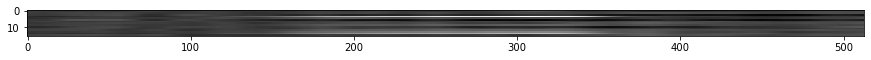

In [3]:
plt.figure(1, figsize=(15, 7))
plt.imshow(np.squeeze(epochs["P300"][6].get_data()), cmap=plt.cm.gray_r, interpolation='nearest')

plt.show()

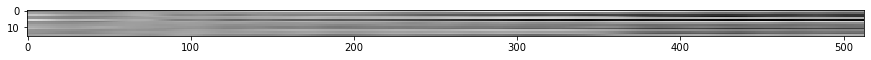

In [4]:
plt.figure(1, figsize=(15, 7))
plt.imshow(np.squeeze(epochs["NoP300"][6].get_data()), cmap=plt.cm.gray_r, interpolation='nearest')

plt.show()

In [5]:
target = epochs["P300"].pick_channels(['Oz','Cz','Pz','Fz'])#.average()
#target.get_data()

In [6]:
standard = epochs["NoP300"].pick_channels(['Oz','Cz','Pz','Fz'])#.average()
standard

Number of events,50128
Events,NoP300: 50128
Time range,-0.301 – 0.699 sec
Baseline,-0.301 – 0.000 sec


In [7]:
def ventanas_mean(epochs,m1,m2,m3,m4,F):
  epochs_part1 = epochs.copy().crop(tmin=m1, tmax=m2)
  epochs_part2 = epochs.copy().crop(tmin=m2, tmax=m3)
  epochs_part3 = epochs.copy().crop(tmin=m3, tmax=m4)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)
  data_part1 = epochs_part1.get_data()
  data_part2 = epochs_part2.get_data()
  data_part3 = epochs_part3.get_data()
  data_part4 = epochs_part4.get_data()
  mean_part1 = np.mean(data_part1[:, :], axis=2)
  mean_part2 = np.mean(data_part2[:, :], axis=2)
  mean_part3 = np.mean(data_part3[:, :], axis=2)
  mean_part4 = np.mean(data_part4[:, :], axis=2)
  return mean_part1, mean_part2, mean_part3, mean_part4

In [8]:
mean_target_part1, mean_target_part2 ,mean_target_part3 ,mean_target_part4 = ventanas_mean(target,-0.3,0,0.25,0.4,0.7)
mean_target_part1.shape, mean_target_part2.shape ,mean_target_part3.shape ,mean_target_part4.shape

<ipython-input-7-6e71144bfdca>:5: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.699219 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)


((10026, 3), (10026, 3), (10026, 3), (10026, 3))

In [9]:
mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4 = ventanas_mean(standard,-0.3,0,0.25,0.4,0.7)
mean_standard_part1.shape, mean_standard_part2.shape, mean_standard_part3.shape, mean_standard_part4.shape

<ipython-input-7-6e71144bfdca>:5: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.699219 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)


((50128, 3), (50128, 3), (50128, 3), (50128, 3))

In [10]:
print(mean_target_part1.shape)
print(mean_standard_part1.shape)
featuresT = np.concatenate((mean_target_part1, mean_target_part2, mean_target_part3, mean_target_part4), axis=1)
featuresF = np.concatenate((mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4), axis=1)
print(featuresT.shape)
print(featuresF.shape)

(10026, 3)
(50128, 3)
(10026, 12)
(50128, 12)


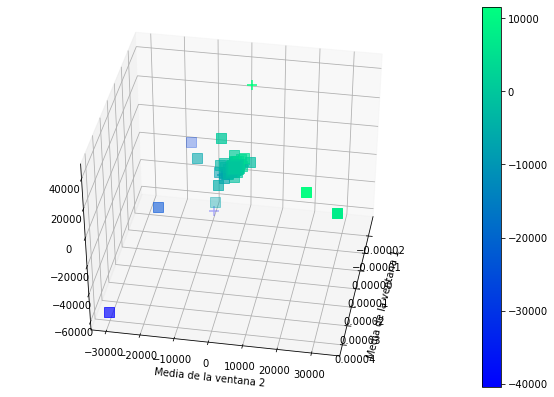

In [11]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

fig = plt.figure(figsize =(10, 7))
ax = fig.add_subplot(111, projection='3d')

x = mean_target_part1[:,1]
y = mean_target_part2[:,1]
z = mean_target_part4[:,1]
c = mean_target_part3[:,1]

x1 = mean_standard_part1[:,1]
y1 = mean_standard_part2[:,1]
z1 = mean_standard_part4[:,1]
c1 = mean_standard_part3[:,1]

img2 = ax.scatter(x1, y1, z1, c=c1, s = 100, marker = "s", cmap=plt.winter())
fig.colorbar(img2)

plt.xlabel('Media de la ventana 1')
plt.ylabel('Media de la ventana 2')
plt.clabel('Media de la ventana 3')


img = ax.scatter(x, y, z, c=c, s = 100,marker = "+", cmap=plt.winter())
ax.view_init(40, 10)
#fig.colorbar(img,img2)
plt.show()

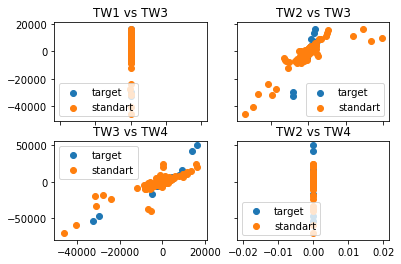

In [12]:
fig, axs = plt.subplots(2, 2)
axs[0, 0].scatter(mean_target_part1,mean_target_part3, label = 'target')
axs[0, 0].scatter(mean_standard_part1,mean_standard_part3, label = 'standart')
axs[0, 0].set_title('TW1 vs TW3')
axs[0, 0].legend()
axs[0, 1].scatter(mean_target_part2,mean_target_part3, label = 'target')
axs[0, 1].scatter(mean_standard_part2,mean_standard_part3, label = 'standart')
axs[0, 1].set_title('TW2 vs TW3')
axs[0, 1].legend()
axs[1, 0].scatter(mean_target_part3, mean_target_part4, label = 'target')
axs[1, 0].scatter(mean_standard_part3, mean_standard_part4, label = 'standart')
axs[1, 0].set_title('TW3 vs TW4')
axs[1, 0].legend()
axs[1, 1].scatter(mean_target_part1,mean_target_part4, label = 'target')
axs[1, 1].scatter(mean_standard_part1,mean_standard_part4, label = 'standart')
axs[1, 1].set_title('TW2 vs TW4')
axs[1, 1].legend()


# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()

10026


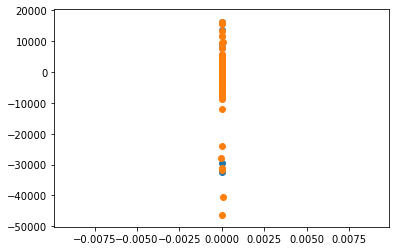

In [13]:
print(len(mean_target_part1))
plt.scatter(mean_target_part1,mean_target_part3)
plt.scatter(mean_standard_part1,mean_standard_part3)

In [14]:
labelT = np.ones([len(mean_target_part1)])
labelF = np.zeros([len(mean_standard_part1)])
print(labelT.shape)
print(labelF.shape)

(10026,)
(50128,)


In [15]:
features = np.concatenate((featuresT,featuresF), axis=0)
labels = np.concatenate((labelT,labelF), axis=0)

print(features.shape)
print(labels.shape)

(60154, 12)
(60154,)


In [16]:
import seaborn as sns
data_df = pd.DataFrame(features)
#data_df.columns = ["M ventana 1", "M ventana 2", "M ventana 3","M ventana 4"]
data_df['P300'] =labels


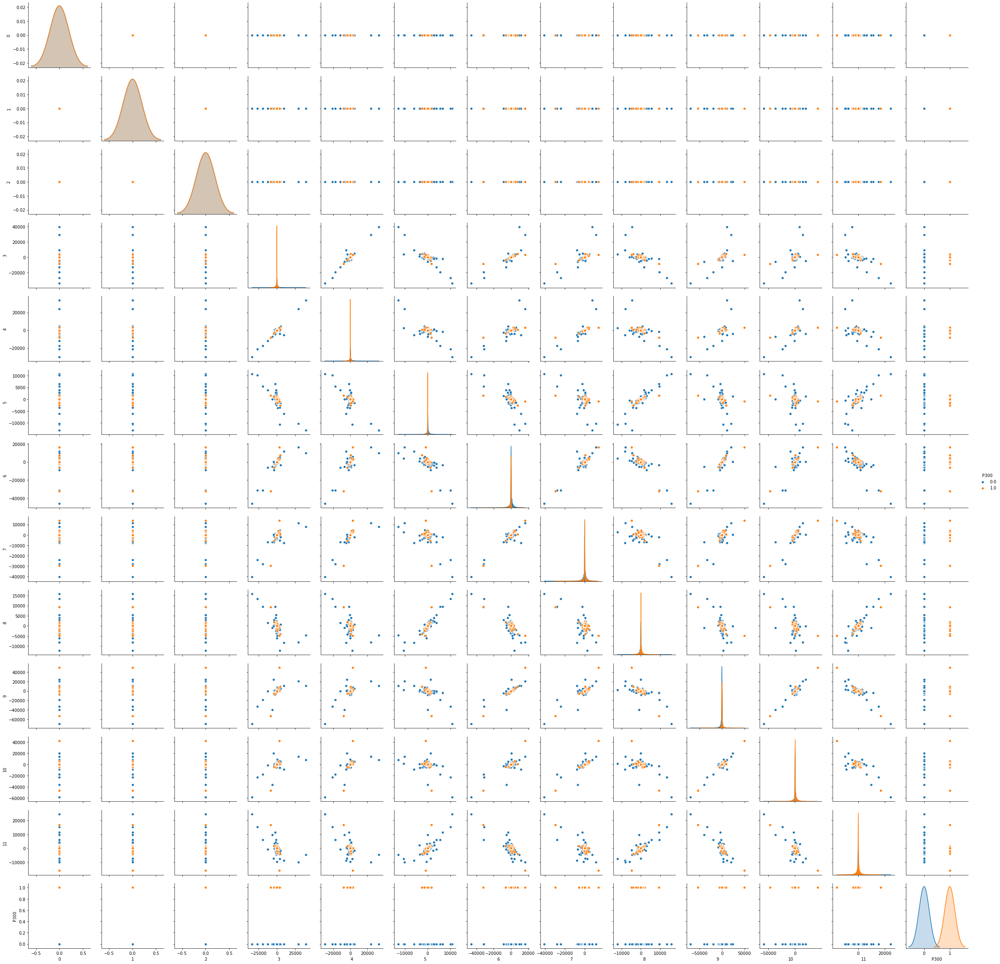

In [17]:
sns.pairplot(data_df, hue="P300", diag_kws={'bw': 0.2})

In [18]:
#from sklearn.feature_selection import VarianceThreshold
#sel = VarianceThreshold(threshold=(.8 * (1 - .8))) # la varianza para una distribucción binomial es Var(x)=p(1-p)
#sel.fit_transform(data_df)

In [19]:
#from sklearn.feature_selection import SelectKBest
#from sklearn.feature_selection import f_classif
#X_new = SelectKBest(f_classif, k=64).fit_transform(X, y) # Utiliza f_test para clasificación
#X_new

In [20]:
#from sklearn.feature_selection import SelectKBest, f_classif

#selector = SelectKBest(f_classif, k=64)
#selector.fit(X_train, y_train)
#scores = -np.log10(selector.pvalues_)
#scores /= scores.max()

## Electrodos promediados

In [21]:
epochs = mne.read_epochs('Data/epocas/elect_mean_epo.fif')
epochs.info

Reading /home/ivandanielvillegas/work/home/BrainInvaders/Data/epocas/elect_mean_epo.fif ...
Isotrak not found
    Found the data of interest:
        t =    -304.00 ...     688.00 ms
        0 CTF compensation matrices available
Not setting metadata
60154 matching events found
No baseline correction applied
0 projection items activated


<Info | 9 non-empty values
 bads: []
 ch_names: O, C, P, F
 chs: 4 EEG
 custom_ref_applied: False
 file_id: 4 items (dict)
 highpass: 0.0 Hz
 lowpass: 62.5 Hz
 meas_date: unspecified
 meas_id: 4 items (dict)
 nchan: 4
 projs: []
 sfreq: 125.0 Hz
>

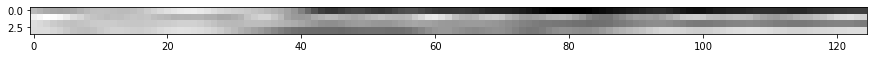

In [22]:
plt.figure(1, figsize=(15, 7))
plt.imshow(np.squeeze(epochs["1"][1].get_data()), cmap=plt.cm.gray_r, interpolation='nearest')

plt.show()

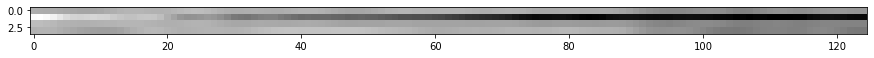

In [23]:
plt.figure(1, figsize=(15, 7))
plt.imshow(np.squeeze(epochs["0"][6].get_data()), cmap=plt.cm.gray_r, interpolation='nearest')

plt.show()

In [24]:
target = epochs["1"]#.average()
#target.get_data()

In [25]:
standard = epochs["0"]#.average()
standard

Number of events,50128
Events,0: 50128
Time range,-0.304 – 0.688 sec
Baseline,off


In [26]:
mean_target_part1, mean_target_part2 ,mean_target_part3 ,mean_target_part4 = ventanas_mean(target,-0.3,0,0.25,0.4,0.7)
mean_target_part1.shape, mean_target_part2.shape ,mean_target_part3.shape ,mean_target_part4.shape

<ipython-input-7-6e71144bfdca>:5: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)


((10026, 4), (10026, 4), (10026, 4), (10026, 4))

In [27]:
mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4 = ventanas_mean(standard,-0.3,0,0.25,0.4,0.7)
mean_standard_part1.shape, mean_standard_part2.shape, mean_standard_part3.shape, mean_standard_part4.shape

<ipython-input-7-6e71144bfdca>:5: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)


((50128, 4), (50128, 4), (50128, 4), (50128, 4))

In [28]:
featuresT = np.concatenate((mean_target_part1, mean_target_part2, mean_target_part3, mean_target_part4), axis=1)
featuresF = np.concatenate((mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4), axis=1)

In [29]:
labelT = np.ones([len(mean_target_part1)])
labelF = np.zeros([len(mean_standard_part1)])

In [30]:
features = np.concatenate((featuresT,featuresF), axis=0)
labels = np.concatenate((labelT,labelF), axis=0)

print(features.shape)
print(labels.shape)

(60154, 16)
(60154,)


In [31]:
data_df = pd.DataFrame(features)
data_df['P300'] =labels

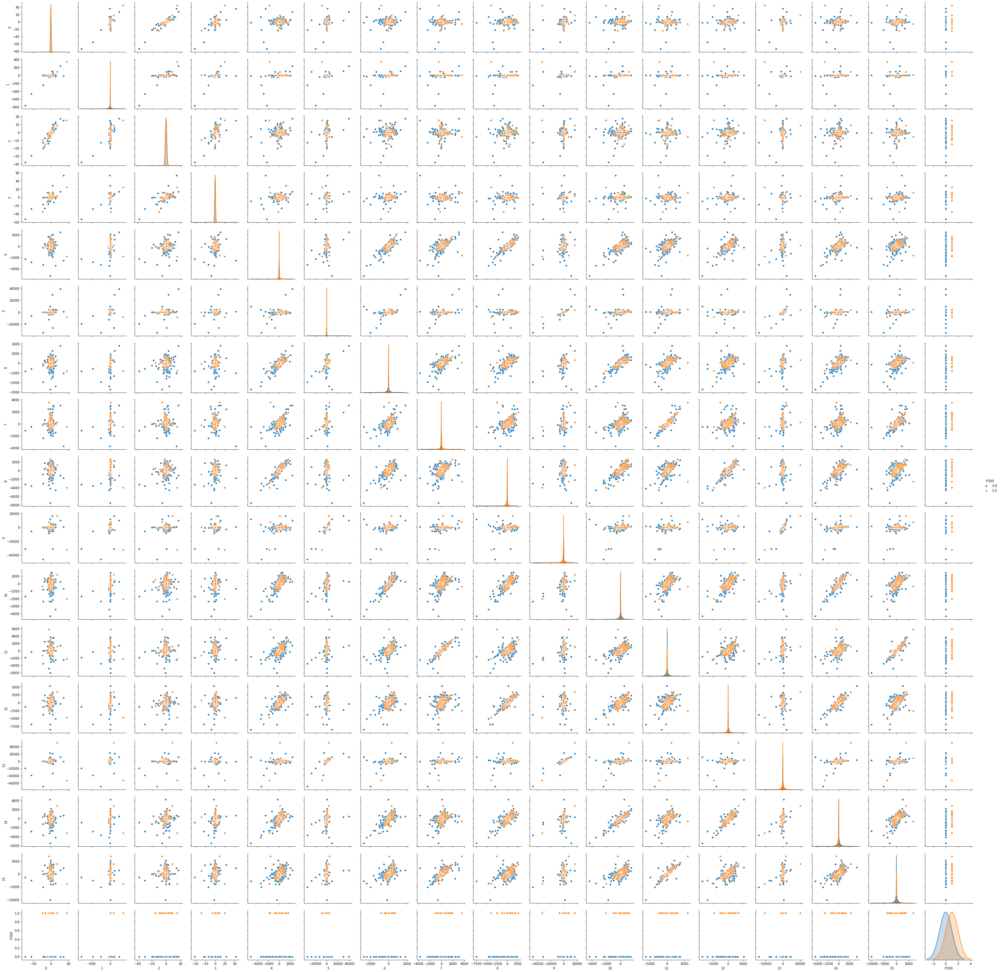

In [32]:
sns.pairplot(data_df, hue="P300", diag_kws={'bw': 1})

## Electrodos promediados cuadrados

In [33]:
def ventanas_exp2(epochs,m1,m2,m3,m4,F):
  epochs_part1 = epochs.copy().crop(tmin=m1, tmax=m2)
  epochs_part2 = epochs.copy().crop(tmin=m2, tmax=m3)
  epochs_part3 = epochs.copy().crop(tmin=m3, tmax=m4)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)
  data_part1 = epochs_part1.get_data()
  data_part2 = epochs_part2.get_data()
  data_part3 = epochs_part3.get_data()
  data_part4 = epochs_part4.get_data()
  mean_part1 = np.mean(data_part1[:, :]**2, axis=2)
  mean_part2 = np.mean(data_part2[:, :]**2, axis=2)
  mean_part3 = np.mean(data_part3[:, :]**2, axis=2)
  mean_part4 = np.mean(data_part4[:, :]**2, axis=2)
  return mean_part1, mean_part2, mean_part3, mean_part4

In [34]:
mean_target_part1, mean_target_part2 ,mean_target_part3 ,mean_target_part4 = ventanas_exp2(target,-0.3,0,0.25,0.4,0.7)

<ipython-input-33-a806944368ba>:5: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)


In [35]:
mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4 = ventanas_mean(standard,-0.3,0,0.25,0.4,0.7)
mean_standard_part1.shape

<ipython-input-7-6e71144bfdca>:5: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)


(50128, 4)

In [36]:
featuresT = np.concatenate((mean_target_part1, mean_target_part2, mean_target_part3, mean_target_part4), axis=1)
featuresF = np.concatenate((mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4), axis=1)
labelT = np.ones([len(mean_target_part1)])
labelF = np.zeros([len(mean_standard_part1)])

In [37]:
features = np.concatenate((featuresT,featuresF), axis=0)
labels = np.concatenate((labelT,labelF), axis=0)

print(features.shape)
print(labels.shape)

(60154, 16)
(60154,)


In [38]:
data_df = pd.DataFrame(features)
data_df['P300'] =labels

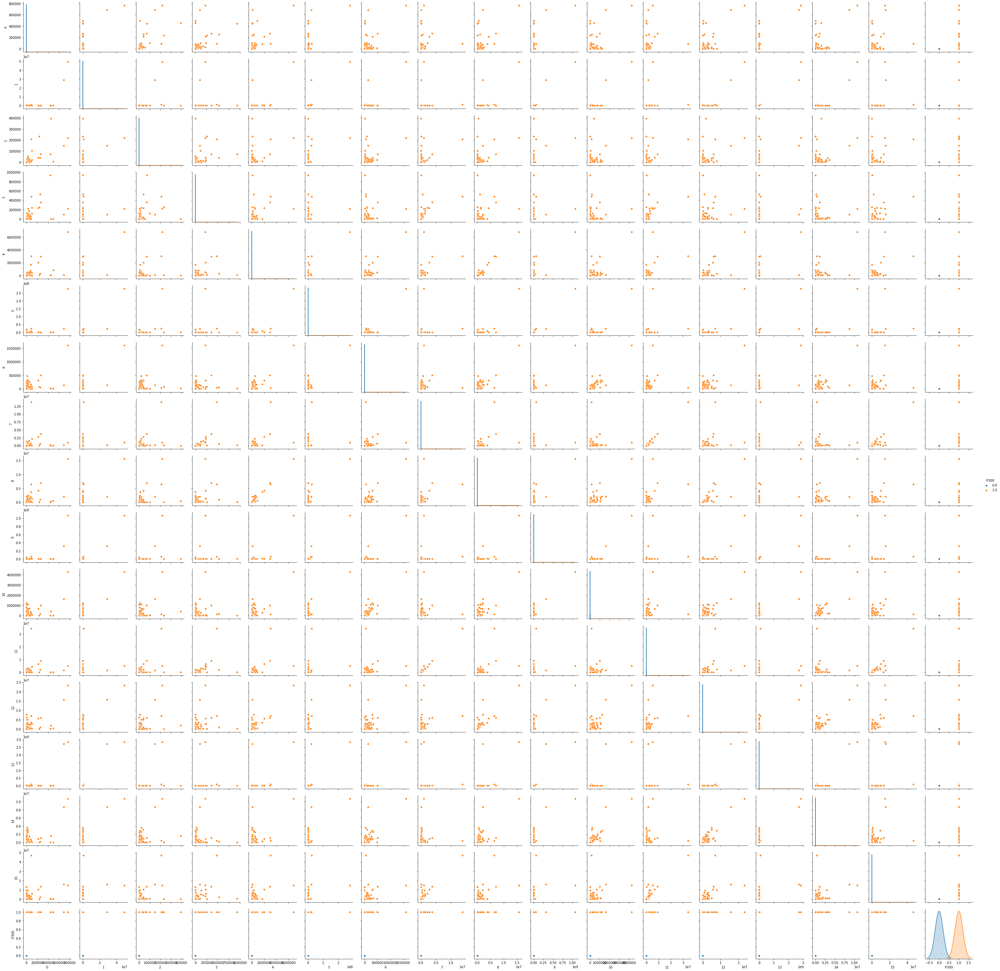

In [39]:
sns.pairplot(data_df, hue="P300", diag_kws={'bw': 0.2})

## Rango Intercuartil

In [40]:
def ventanas_IQR(epochs,m1,m2,m3,m4,F):
  epochs_part1 = epochs.copy().crop(tmin=m1, tmax=m2)
  epochs_part2 = epochs.copy().crop(tmin=m2, tmax=m3)
  epochs_part3 = epochs.copy().crop(tmin=m3, tmax=m4)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)
  data_part1 = epochs_part1.get_data()
  data_part2 = epochs_part2.get_data()
  data_part3 = epochs_part3.get_data()
  data_part4 = epochs_part4.get_data()
  mean_part1 = np.percentile(data_part1[:, :],75, axis=2)-np.percentile(data_part1[:, :],25, axis=2)
  mean_part2 = np.percentile(data_part2[:, :],75, axis=2)-np.percentile(data_part2[:, :],25, axis=2)
  mean_part3 = np.percentile(data_part3[:, :],75, axis=2)-np.percentile(data_part3[:, :],25, axis=2)
  mean_part4 = np.percentile(data_part4[:, :],75, axis=2)-np.percentile(data_part4[:, :],25, axis=2)
  return mean_part1, mean_part2, mean_part3, mean_part4

In [41]:
mean_target_part1, mean_target_part2 ,mean_target_part3 ,mean_target_part4 = ventanas_IQR(target,-0.3,0,0.25,0.4,0.7)
mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4 = ventanas_IQR(standard,-0.3,0,0.25,0.4,0.7)
mean_standard_part1.shape

<ipython-input-40-db9ed395834d>:5: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)
<ipython-input-40-db9ed395834d>:5: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)


(50128, 4)

In [42]:
featuresT = np.concatenate((mean_target_part1, mean_target_part2, mean_target_part3, mean_target_part4), axis=1)
featuresF = np.concatenate((mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4), axis=1)
labelT = np.ones([len(mean_target_part1)])
labelF = np.zeros([len(mean_standard_part1)])

In [43]:
features = np.concatenate((featuresT,featuresF), axis=0)
labels = np.concatenate((labelT,labelF), axis=0)

print(features.shape)
print(labels.shape)

(60154, 16)
(60154,)


In [44]:
data_df = pd.DataFrame(features)
data_df['P300'] =labels

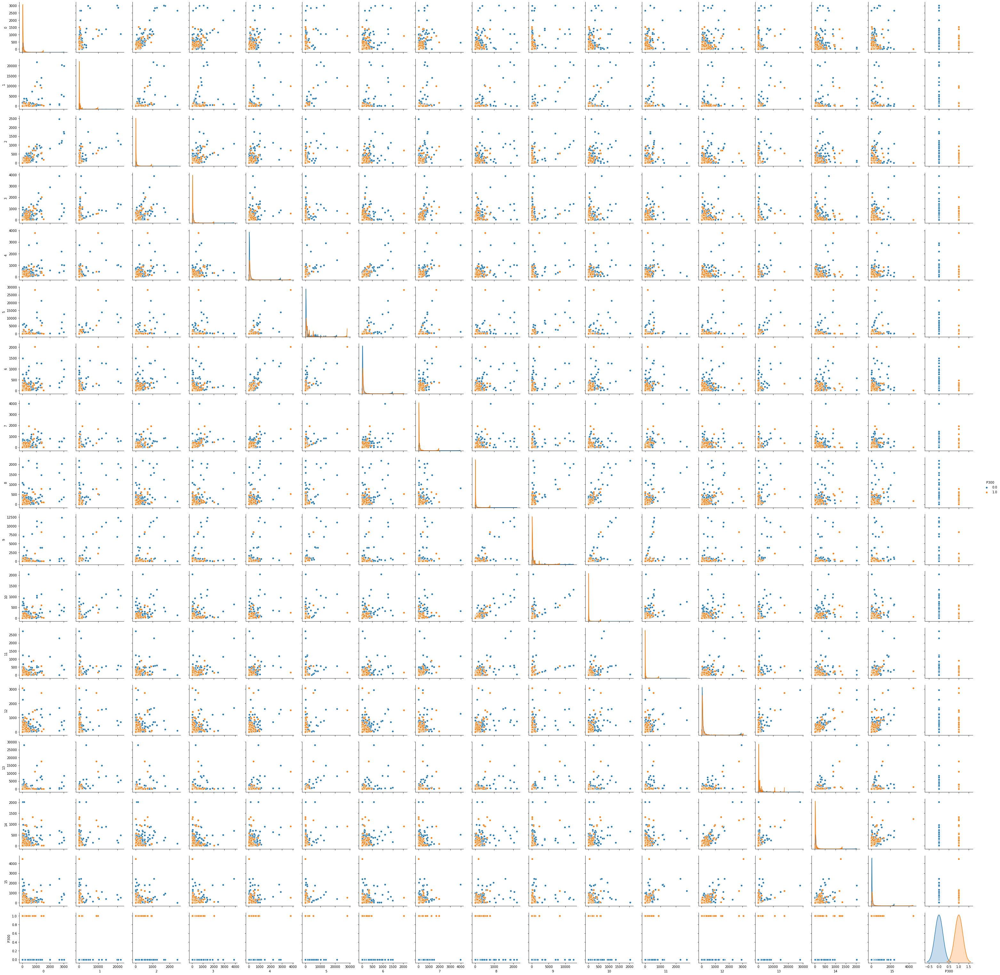

In [45]:
sns.pairplot(data_df, hue="P300", diag_kws={'bw': 0.2})

## Desviación estandar

In [46]:
def ventanas_STR(epochs,m1,m2,m3,m4,F):
  epochs_part1 = epochs.copy().crop(tmin=m1, tmax=m2)
  epochs_part2 = epochs.copy().crop(tmin=m2, tmax=m3)
  epochs_part3 = epochs.copy().crop(tmin=m3, tmax=m4)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)
  data_part1 = epochs_part1.get_data()
  data_part2 = epochs_part2.get_data()
  data_part3 = epochs_part3.get_data()
  data_part4 = epochs_part4.get_data()
  mean_part1 = np.std(data_part1[:, :], axis=2)
  mean_part2 = np.std(data_part2[:, :], axis=2)
  mean_part3 = np.std(data_part3[:, :], axis=2)
  mean_part4 = np.std(data_part4[:, :], axis=2)
  return mean_part1, mean_part2, mean_part3, mean_part4

In [47]:
mean_target_part1, mean_target_part2 ,mean_target_part3 ,mean_target_part4 = ventanas_STR(target,-0.3,0,0.25,0.4,0.7)
mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4 = ventanas_STR(standard,-0.3,0,0.25,0.4,0.7)
mean_standard_part1.shape

<ipython-input-46-f5938f916751>:5: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)
<ipython-input-46-f5938f916751>:5: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)


(50128, 4)

In [48]:
featuresT = np.concatenate((mean_target_part1, mean_target_part2, mean_target_part3, mean_target_part4), axis=1)
featuresF = np.concatenate((mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4), axis=1)
labelT = np.ones([len(mean_target_part1)])
labelF = np.zeros([len(mean_standard_part1)])
features = np.concatenate((featuresT,featuresF), axis=0)
labels = np.concatenate((labelT,labelF), axis=0)

print(features.shape)
print(labels.shape)

(60154, 16)
(60154,)


In [49]:
data_df = pd.DataFrame(features)
data_df['P300'] =labels

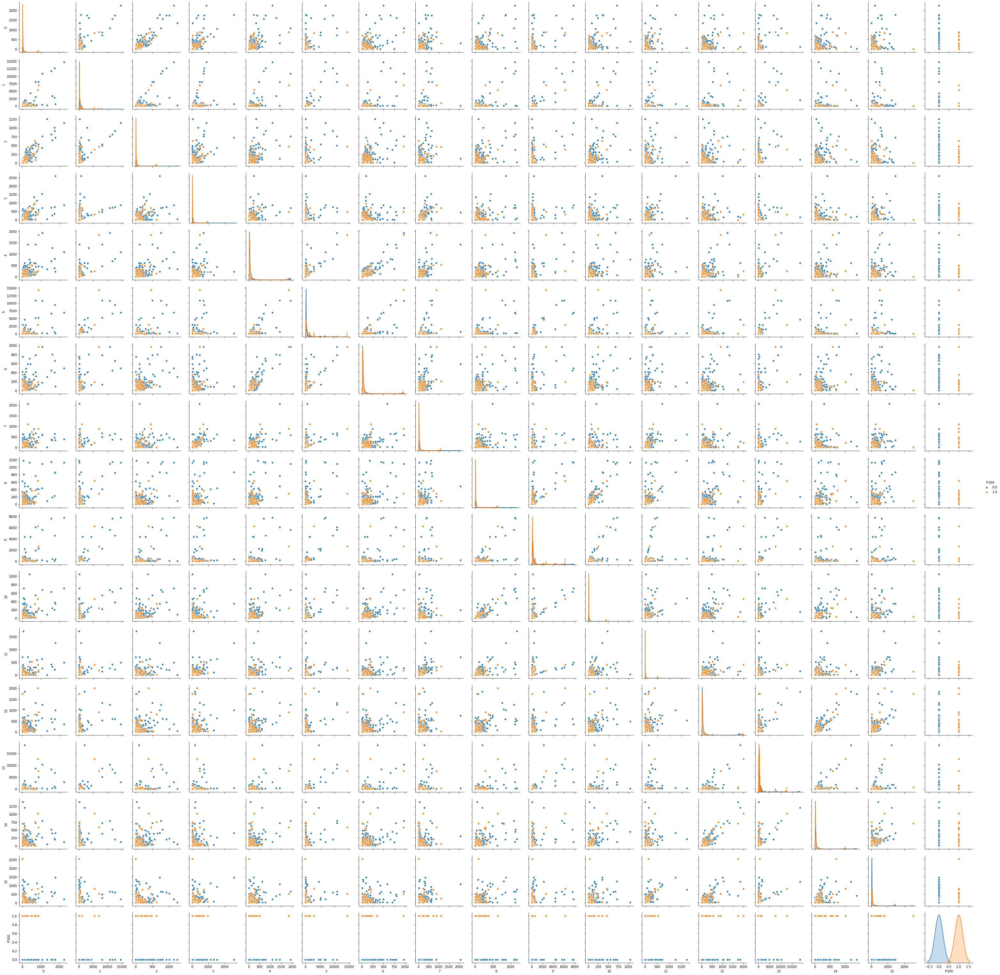

In [50]:
sns.pairplot(data_df, hue="P300", diag_kws={'bw': 0.2})

## Desviación máxima

In [51]:
def ventanas_maxSTR(epochs,m1,m2,m3,m4,F):
  std = np.std(epochs.get_data())
  epochs_part1 = epochs.copy().crop(tmin=m1, tmax=m2)
  epochs_part2 = epochs.copy().crop(tmin=m2, tmax=m3)
  epochs_part3 = epochs.copy().crop(tmin=m3, tmax=m4)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)
  data_part1 = epochs_part1.get_data()
  data_part2 = epochs_part2.get_data()
  data_part3 = epochs_part3.get_data()
  data_part4 = epochs_part4.get_data()
  mean_part1 = np.max(data_part1[:, :], axis=2)/std
  mean_part2 = np.max(data_part2[:, :], axis=2)/std
  mean_part3 = np.max(data_part3[:, :], axis=2)/std
  mean_part4 = np.max(data_part4[:, :], axis=2)/std
  return mean_part1, mean_part2, mean_part3, mean_part4

In [52]:
mean_target_part1, mean_target_part2 ,mean_target_part3 ,mean_target_part4 = ventanas_maxSTR(target,-0.3,0,0.25,0.4,0.7)
mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4 = ventanas_maxSTR(standard,-0.3,0,0.25,0.4,0.7)
mean_standard_part1.shape

<ipython-input-51-ce5d1eba5bab>:6: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)
<ipython-input-51-ce5d1eba5bab>:6: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)


(50128, 4)

In [53]:
featuresT = np.concatenate((mean_target_part1, mean_target_part2, mean_target_part3, mean_target_part4), axis=1)
featuresF = np.concatenate((mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4), axis=1)
labelT = np.ones([len(mean_target_part1)])
labelF = np.zeros([len(mean_standard_part1)])

In [54]:
features = np.concatenate((featuresT,featuresF), axis=0)
labels = np.concatenate((labelT,labelF), axis=0)

print(features.shape)
print(labels.shape)

(60154, 16)
(60154,)


In [55]:
data_df = pd.DataFrame(features)
data_df['P300'] =labels

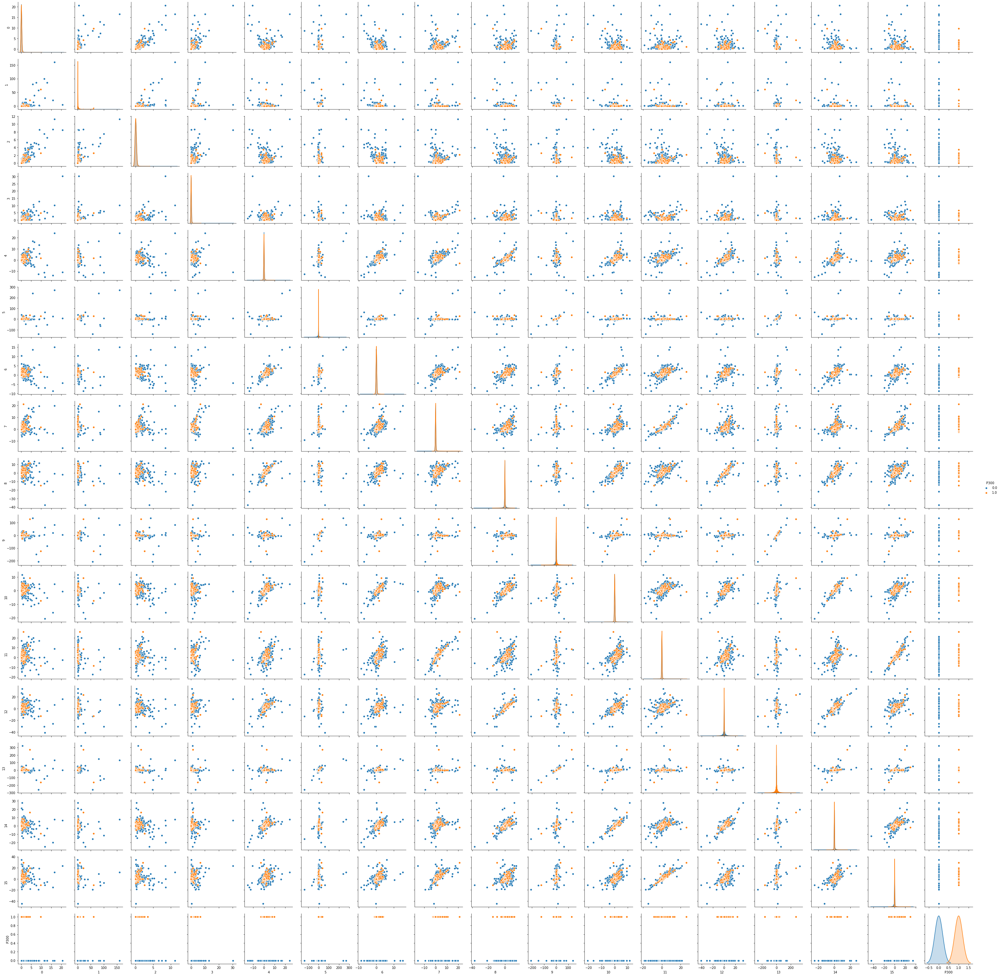

In [56]:
sns.pairplot(data_df, hue="P300", diag_kws={'bw': 0.2})

## Coeficiente de Variación

In [57]:
def ventanas_CV(epochs,m1,m2,m3,m4,F):
  prom = np.mean(epochs.get_data()) # Si pongo este parametro la distribución cambia   , axis=2
  epochs_part1 = epochs.copy().crop(tmin=m1, tmax=m2)
  epochs_part2 = epochs.copy().crop(tmin=m2, tmax=m3)
  epochs_part3 = epochs.copy().crop(tmin=m3, tmax=m4)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)
  data_part1 = epochs_part1.get_data()
  data_part2 = epochs_part2.get_data()
  data_part3 = epochs_part3.get_data()
  data_part4 = epochs_part4.get_data()
  mean_part1 = np.std(data_part1[:, :], axis=2)/prom
  mean_part2 = np.std(data_part2[:, :], axis=2)/prom
  mean_part3 = np.std(data_part3[:, :], axis=2)/prom
  mean_part4 = np.std(data_part4[:, :], axis=2)/prom
  return mean_part1, mean_part2, mean_part3, mean_part4

In [58]:
mean_target_part1, mean_target_part2 ,mean_target_part3 ,mean_target_part4 = ventanas_CV(target,-0.3,0,0.25,0.4,0.7)
mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4 = ventanas_CV(standard,-0.3,0,0.25,0.4,0.7)
mean_standard_part1.shape

<ipython-input-57-c791974f6235>:6: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)
<ipython-input-57-c791974f6235>:6: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)


(50128, 4)

In [59]:
featuresT = np.concatenate((mean_target_part1, mean_target_part2, mean_target_part3, mean_target_part4), axis=1)
featuresF = np.concatenate((mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4), axis=1)
labelT = np.ones([len(mean_target_part1)])
labelF = np.zeros([len(mean_standard_part1)])

In [60]:
features = np.concatenate((featuresT,featuresF), axis=0)
labels = np.concatenate((labelT,labelF), axis=0)

print(features.shape)
print(labels.shape)

(60154, 16)
(60154,)


In [61]:
data_df = pd.DataFrame(features)
data_df['P300'] =labels

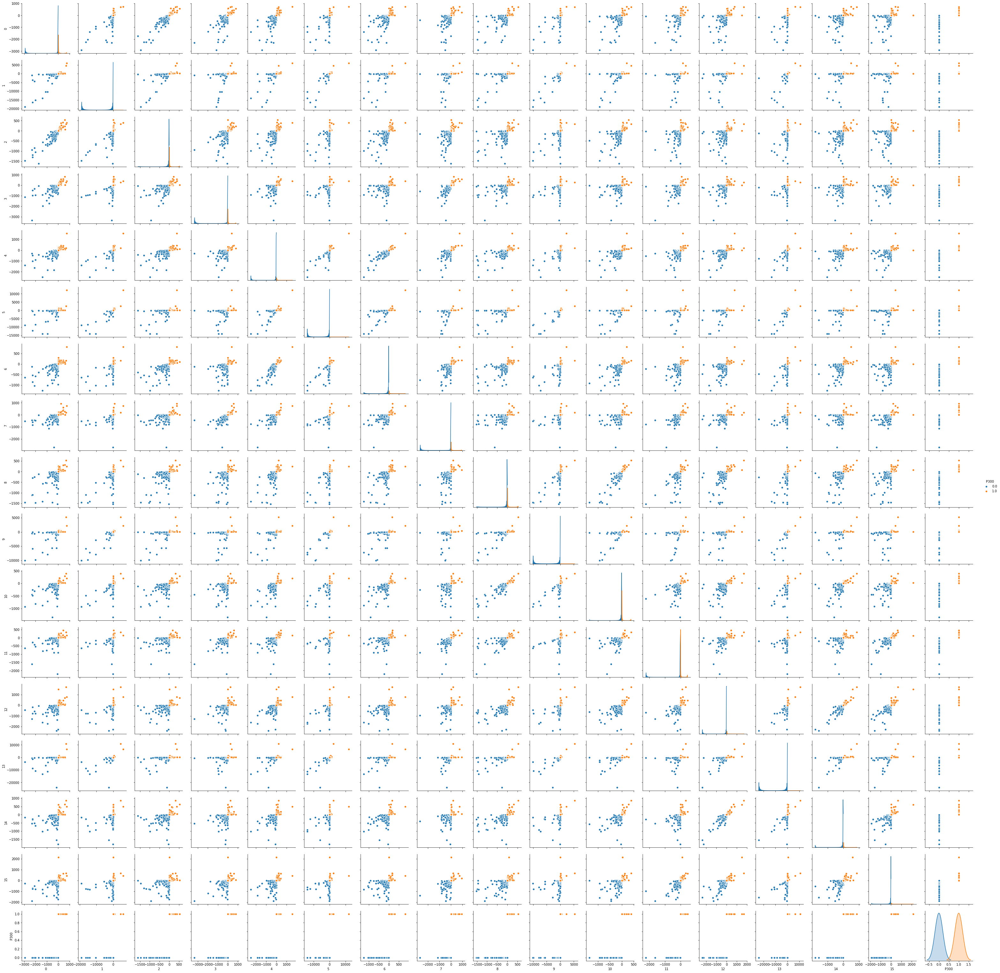

In [62]:
sns.pairplot(data_df, hue="P300", diag_kws={'bw': 0.2})

## Coeficiente de Variación por Ventana

In [63]:
def ventanas_WindCV(epochs,m1,m2,m3,m4,F):
  prom = np.mean(epochs.get_data()) # Si pongo este parametro la distribución cambia   , axis=2
  epochs_part1 = epochs.copy().crop(tmin=m1, tmax=m2)
  epochs_part2 = epochs.copy().crop(tmin=m2, tmax=m3)
  epochs_part3 = epochs.copy().crop(tmin=m3, tmax=m4)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)
  data_part1 = epochs_part1.get_data()
  data_part2 = epochs_part2.get_data()
  data_part3 = epochs_part3.get_data()
  data_part4 = epochs_part4.get_data()
  mean_part1 = np.std(data_part1[:, :], axis=2)/np.mean(data_part1[:, :], axis=2)
  mean_part2 = np.std(data_part2[:, :], axis=2)/np.mean(data_part2[:, :], axis=2)
  mean_part3 = np.std(data_part3[:, :], axis=2)/np.mean(data_part3[:, :], axis=2)
  mean_part4 = np.std(data_part4[:, :], axis=2)/np.mean(data_part4[:, :], axis=2)
  return mean_part1, mean_part2, mean_part3, mean_part4

In [64]:
mean_target_part1, mean_target_part2 ,mean_target_part3 ,mean_target_part4 = ventanas_WindCV(target,-0.3,0,0.25,0.4,0.7)
mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4 = ventanas_WindCV(standard,-0.3,0,0.25,0.4,0.7)
mean_standard_part1.shape

<ipython-input-63-9d491302188d>:6: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)
<ipython-input-63-9d491302188d>:6: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)


(50128, 4)

In [65]:
featuresT = np.concatenate((mean_target_part1, mean_target_part2, mean_target_part3, mean_target_part4), axis=1)
featuresF = np.concatenate((mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4), axis=1)
labelT = np.ones([len(mean_target_part1)])
labelF = np.zeros([len(mean_standard_part1)])
features = np.concatenate((featuresT,featuresF), axis=0)
labels = np.concatenate((labelT,labelF), axis=0)

print(features.shape)
print(labels.shape)

(60154, 16)
(60154,)


In [66]:
data_df = pd.DataFrame(features)
data_df['P300'] =labels

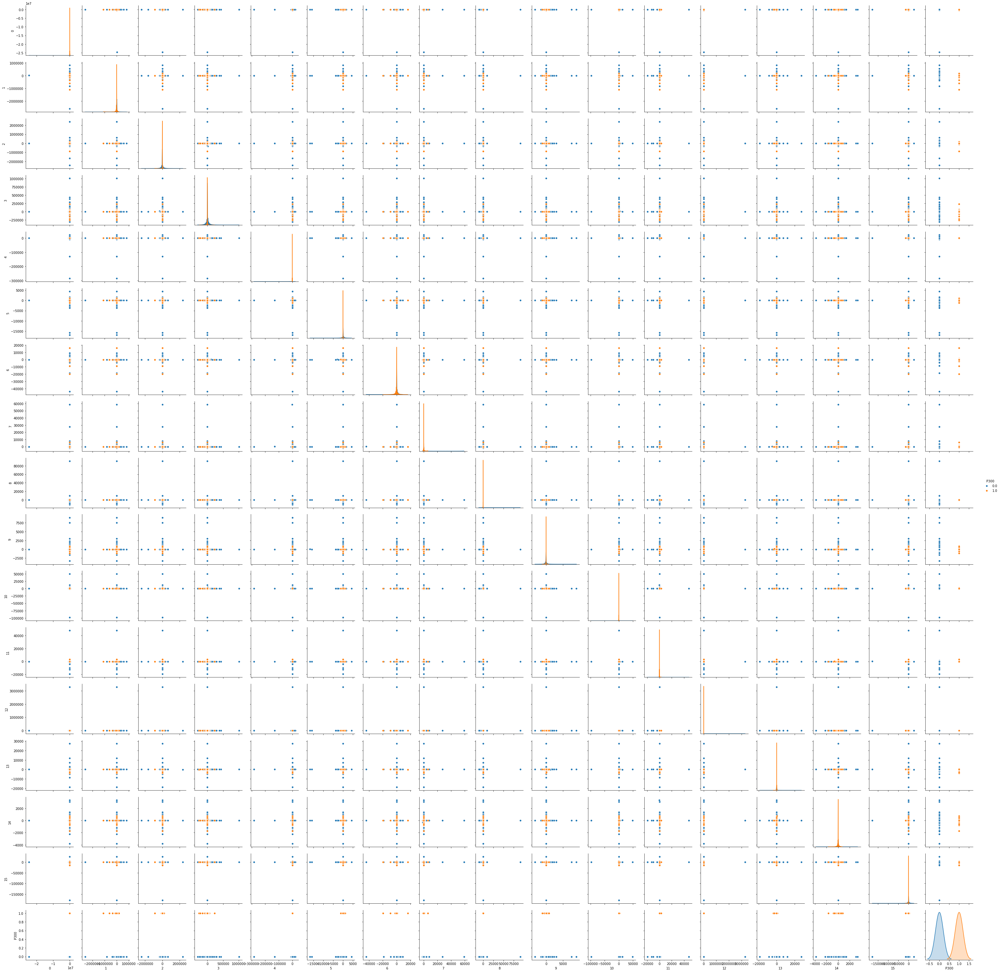

In [67]:
sns.pairplot(data_df, hue="P300", diag_kws={'bw': 0.2})

## Coeficiente de variación con media general

In [68]:
def ventanas_CVGen(media,epochs,m1,m2,m3,m4,F):
  epochs_part1 = epochs.copy().crop(tmin=m1, tmax=m2)
  epochs_part2 = epochs.copy().crop(tmin=m2, tmax=m3)
  epochs_part3 = epochs.copy().crop(tmin=m3, tmax=m4)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)
  data_part1 = epochs_part1.get_data()
  data_part2 = epochs_part2.get_data()
  data_part3 = epochs_part3.get_data()
  data_part4 = epochs_part4.get_data()
  mean_part1 = np.std(data_part1[:, :], axis=2)/media
  mean_part2 = np.std(data_part2[:, :], axis=2)/media
  mean_part3 = np.std(data_part3[:, :], axis=2)/media
  mean_part4 = np.std(data_part4[:, :], axis=2)/media
  return mean_part1, mean_part2, mean_part3, mean_part4

In [69]:
media = np.mean(epochs.get_data())
mean_target_part1, mean_target_part2 ,mean_target_part3 ,mean_target_part4 = ventanas_CVGen(media,target,-0.3,0,0.25,0.4,0.7)
mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4 = ventanas_CVGen(media,standard,-0.3,0,0.25,0.4,0.7)
mean_standard_part1.shape

<ipython-input-68-1328eada4146>:5: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)
<ipython-input-68-1328eada4146>:5: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)


(50128, 4)

In [70]:
featuresT = np.concatenate((mean_target_part1, mean_target_part2, mean_target_part3, mean_target_part4), axis=1)
featuresF = np.concatenate((mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4), axis=1)
labelT = np.ones([len(mean_target_part1)])
labelF = np.zeros([len(mean_standard_part1)])
features = np.concatenate((featuresT,featuresF), axis=0)
labels = np.concatenate((labelT,labelF), axis=0)

print(features.shape)
print(labels.shape)

(60154, 16)
(60154,)


In [71]:
data_df = pd.DataFrame(features)
data_df['P300'] =labels

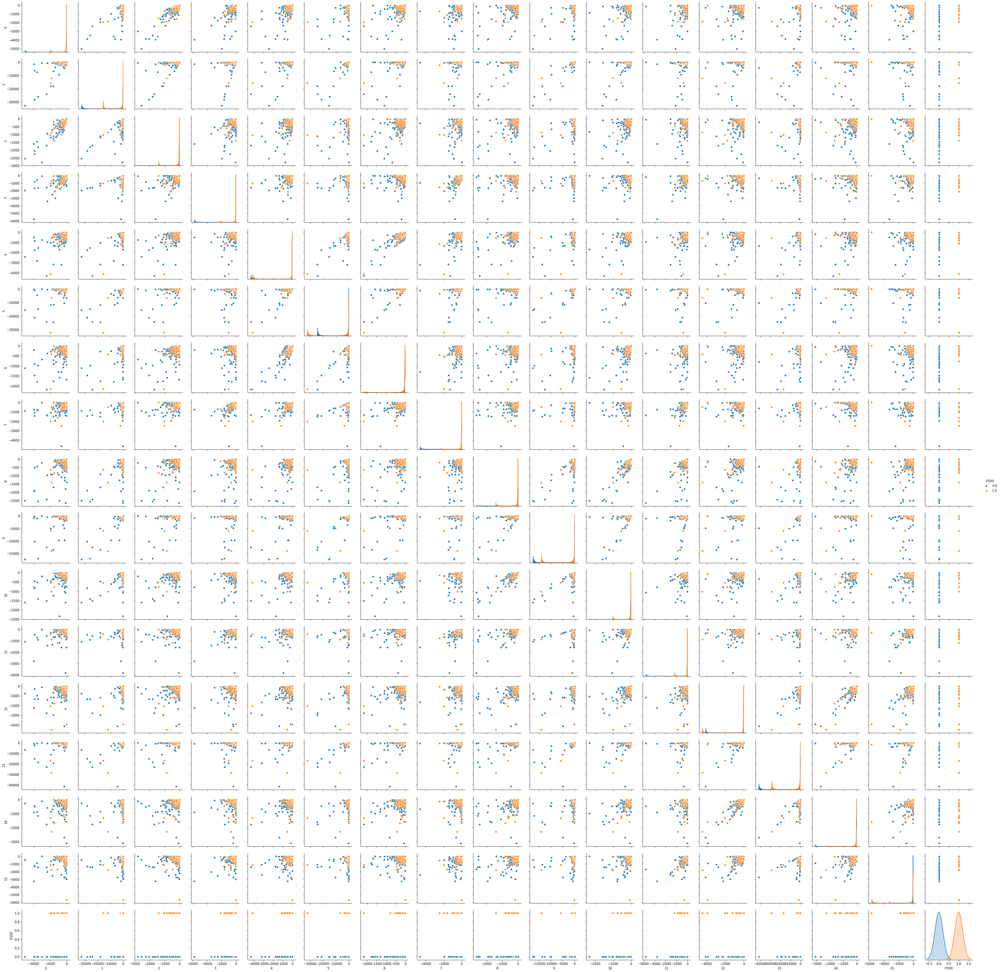

In [72]:
sns.pairplot(data_df, hue="P300", diag_kws={'bw': 0.2})

## Delta Amplitud / Delta Tiempo

In [73]:
def buscar_indice_max_min(a):
  max_indices = []
  min_indices = []
  for i in range(a.shape[1]):
    index = np.argmax(a[:, i])
    max_indices.append(index)
  for i in range(a.shape[1]):
    index = np.argmin(a[:, i])
    min_indices.append(index)
  return np.array(max_indices), np.array(min_indices)

In [74]:
def ventanas_DADT(epochs,m1,m2,m3,m4,F):
  epochs_part1 = epochs.copy().crop(tmin=m1, tmax=m2)
  epochs_part2 = epochs.copy().crop(tmin=m2, tmax=m3)
  epochs_part3 = epochs.copy().crop(tmin=m3, tmax=m4)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)
  data_part1 = epochs_part1.get_data()
  data_part2 = epochs_part2.get_data()
  data_part3 = epochs_part3.get_data()
  data_part4 = epochs_part4.get_data()
  max_part1 = np.max(data_part1[:, :], axis=2)
  max_part2 = np.max(data_part2[:, :], axis=2)
  max_part3 = np.max(data_part3[:, :], axis=2)
  max_part4 = np.max(data_part4[:, :], axis=2)
  min_part1 = np.min(data_part1[:, :], axis=2)
  min_part2 = np.min(data_part2[:, :], axis=2)
  min_part3 = np.min(data_part3[:, :], axis=2)
  min_part4 = np.min(data_part4[:, :], axis=2)
  index_max_part1, index_min_part1 = buscar_indice_max_min(data_part1[:, :])
  index_max_part2, index_min_part2 = buscar_indice_max_min(data_part2[:, :])
  index_max_part3, index_min_part3 = buscar_indice_max_min(data_part3[:, :])
  index_max_part4, index_min_part4 = buscar_indice_max_min(data_part4[:, :])
  mean_part1 = (max_part1-min_part1)/(index_max_part1-index_min_part1)
  mean_part2 = (max_part2-min_part2)/(index_max_part2-index_min_part2)
  mean_part3 = (max_part3-min_part3)/(index_max_part3-index_min_part3)
  mean_part4 = (max_part4-min_part4)/(index_max_part4-index_min_part4)
  return mean_part1, mean_part2, mean_part3, mean_part4

In [75]:
mean_target_part1, mean_target_part2 ,mean_target_part3 ,mean_target_part4 = ventanas_DADT(target,-0.3,0,0.25,0.4,0.7)
mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4 = ventanas_DADT(standard,-0.3,0,0.25,0.4,0.7)
mean_standard_part1.shape

<ipython-input-74-b502dd3e1089>:5: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)
<ipython-input-74-b502dd3e1089>:5: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)


(50128, 4)

In [76]:
featuresT = np.concatenate((mean_target_part1, mean_target_part2, mean_target_part3, mean_target_part4), axis=1)
featuresF = np.concatenate((mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4), axis=1)
labelT = np.ones([len(mean_target_part1)])
labelF = np.zeros([len(mean_standard_part1)])
features = np.concatenate((featuresT,featuresF), axis=0)
labels = np.concatenate((labelT,labelF), axis=0)

print(features.shape)
print(labels.shape)

(60154, 16)
(60154,)


In [77]:
data_df = pd.DataFrame(features)
data_df['P300'] =labels

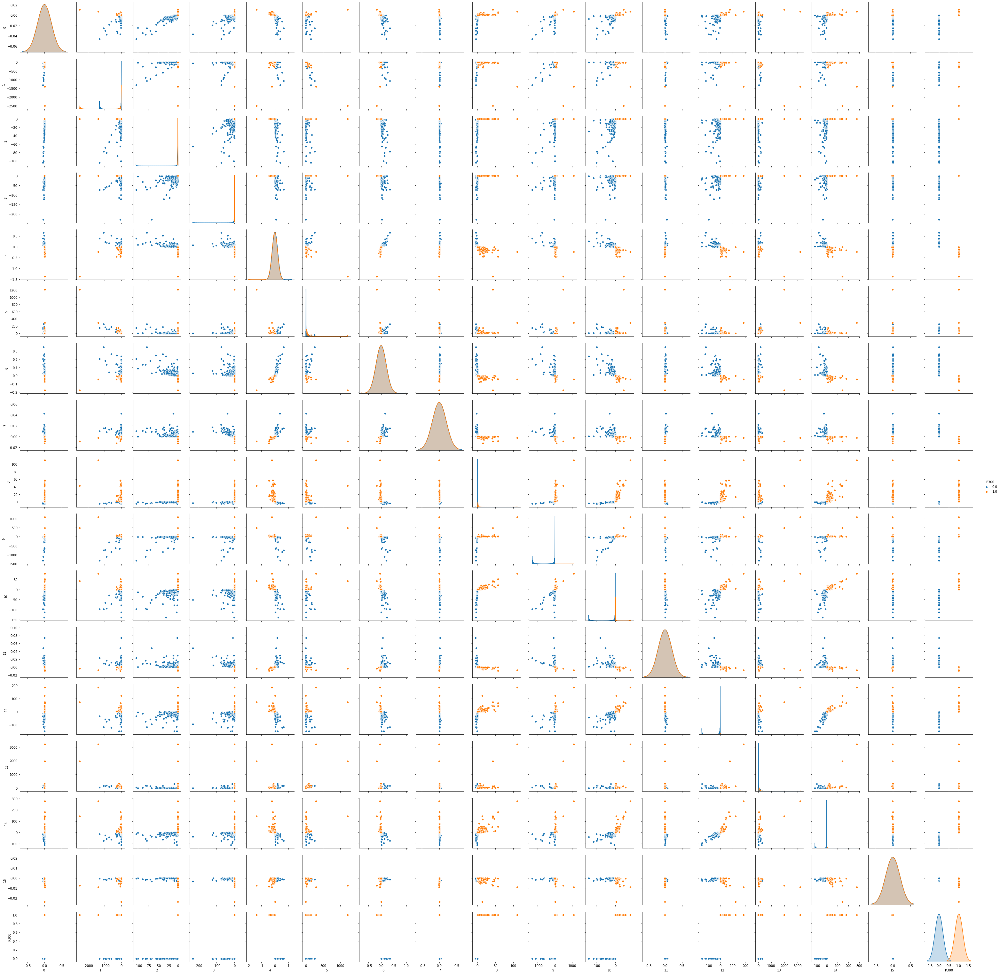

In [78]:
sns.pairplot(data_df, hue="P300", diag_kws={'bw': 0.2})

## Convolución

In [79]:
def convol(data):
  part = data[69:88]
  conv = np.convolve(part,data)
  #return np.partition(conv, len(data))[:len(data)] # Datos menores en la correlación
  return np.partition(conv, -len(data))[-len(data):] # Datos mayores en la correlación

In [80]:
a = [1,2,3,4,4,3,2,1]
b = [2,3,4]
print(np.convolve(a,b))

[ 2  7 16 25 32 34 29 20 11  4]


Not setting metadata
10026 matching events found
No baseline correction applied
0 projection items activated


<ipython-input-81-5fdd83ae23d3>:2: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  de_epochs['1'].plot_image(picks=['F'])#P300


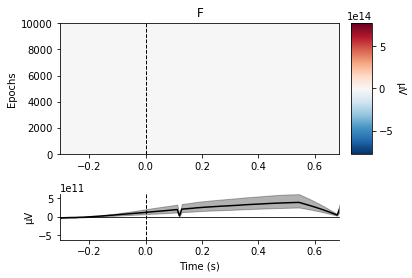

Not setting metadata
50128 matching events found
No baseline correction applied
0 projection items activated


<ipython-input-81-5fdd83ae23d3>:3: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  de_epochs['0'].plot_image(picks=['F'])


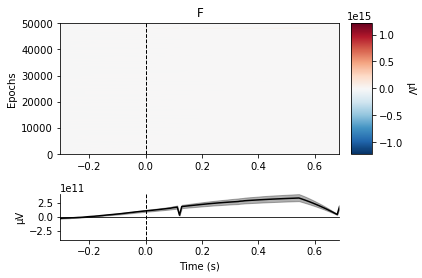

Not setting metadata
10026 matching events found
No baseline correction applied
0 projection items activated


<ipython-input-81-5fdd83ae23d3>:4: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  de_epochs['1'].plot_image(picks=['C'])#P300


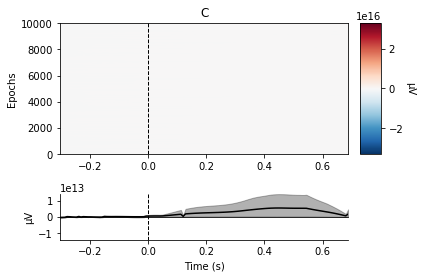

Not setting metadata
50128 matching events found
No baseline correction applied
0 projection items activated


<ipython-input-81-5fdd83ae23d3>:5: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  de_epochs['0'].plot_image(picks=['C'])


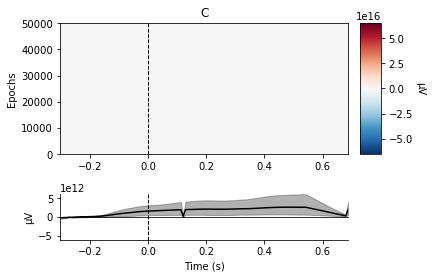

Not setting metadata
10026 matching events found
No baseline correction applied
0 projection items activated


<ipython-input-81-5fdd83ae23d3>:6: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  de_epochs['1'].plot_image(picks=['P'])#P300


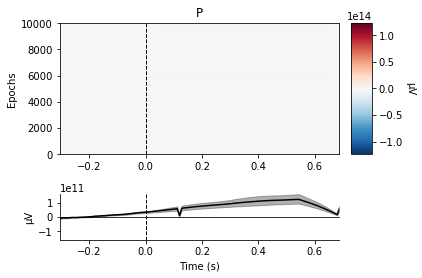

Not setting metadata
50128 matching events found
No baseline correction applied
0 projection items activated


<ipython-input-81-5fdd83ae23d3>:7: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  de_epochs['0'].plot_image(picks=['P'])


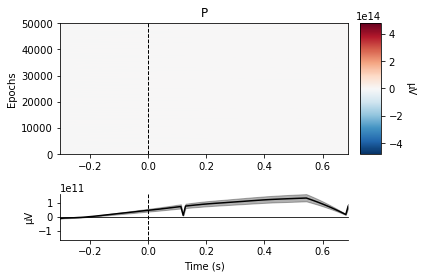

Not setting metadata
10026 matching events found
No baseline correction applied
0 projection items activated


<ipython-input-81-5fdd83ae23d3>:8: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  de_epochs['1'].plot_image(picks=['O'])#P300


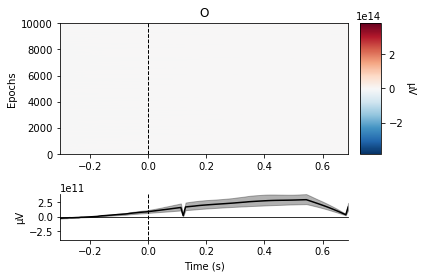

Not setting metadata
50128 matching events found
No baseline correction applied
0 projection items activated


<ipython-input-81-5fdd83ae23d3>:9: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  de_epochs['0'].plot_image(picks=['O'])


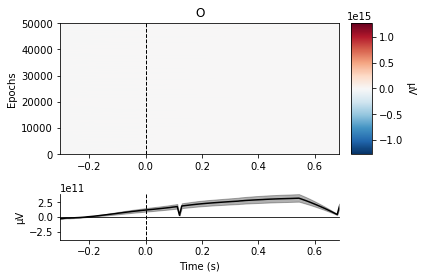

[<Figure size 432x288 with 3 Axes>]

In [81]:
de_epochs = epochs.copy().apply_function(convol)
de_epochs['1'].plot_image(picks=['F'])#P300
de_epochs['0'].plot_image(picks=['F'])
de_epochs['1'].plot_image(picks=['C'])#P300
de_epochs['0'].plot_image(picks=['C'])
de_epochs['1'].plot_image(picks=['P'])#P300
de_epochs['0'].plot_image(picks=['P'])
de_epochs['1'].plot_image(picks=['O'])#P300
de_epochs['0'].plot_image(picks=['O'])

In [82]:
def ventanas_Convo(epochs,m1,m2,m3,m4,F):
  epochs_part1 = epochs.copy().crop(tmin=m1, tmax=m2)
  epochs_part2 = epochs.copy().crop(tmin=m2, tmax=m3)
  epochs_part3 = epochs.copy().crop(tmin=m3, tmax=m4)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)
  print(epochs_part1)
  data_part1 = epochs_part1.get_data()
  data_part2 = epochs_part2.get_data()
  data_part3 = epochs_part3.get_data()
  data_part4 = epochs_part4.get_data()
  mean_part1 = np.convolve(data_part1[1],data_part1[0])
  #mean_part2 = np.convolve(data_part1[:, 2],data_part2[:, 2])
  #mean_part3 = np.convolve(data_part1[:, 3],data_part3[:, 3])
  #mean_part4 = np.convolve(data_part1[:, 1],data_part4[:, 1])
  return mean_part1#, mean_part2, mean_part3, mean_part4

In [83]:
mean_target_part1, mean_target_part2 ,mean_target_part3 ,mean_target_part4 = ventanas_Convo(target,-0.3,-0.05,0.2,0.45,0.7)
mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4 = ventanas_Convo(standard,-0.3,-0.05,0.2,0.45,0.7)
mean_standard_part1.shape

<EpochsFIF |  10026 events (all good), -0.304 - -0.048 sec, baseline off, ~10.1 MB, data loaded,
 '1': 10026>


<ipython-input-82-2bc902f41f7b>:5: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = epochs.copy().crop(tmin=m4, tmax=F)


ValueError: object too deep for desired array

In [ ]:
featuresT = np.concatenate((mean_target_part1, mean_target_part2, mean_target_part3, mean_target_part4), axis=1)
featuresF = np.concatenate((mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4), axis=1)
labelT = np.ones([len(mean_target_part1)])
labelF = np.zeros([len(mean_standard_part1)])
features = np.concatenate((featuresT,featuresF), axis=0)
labels = np.concatenate((labelT,labelF), axis=0)

print(features.shape)
print(labels.shape)

In [ ]:
data_df = pd.DataFrame(features)
data_df['P300'] =labels

In [ ]:
sns.pairplot(data_df, hue="P300", diag_kws={'bw': 0.2})

# Derivada

In [84]:
def derivada(data):
    return np.gradient(data)

def ventanas_derivada_mean(epochs,m1,m2,m3,m4,F):
  de_epochs = epochs.copy().apply_function(derivada)
  epochs_part1 = de_epochs.copy().crop(tmin=m1, tmax=m2)
  epochs_part2 = de_epochs.copy().crop(tmin=m2, tmax=m3)
  epochs_part3 = de_epochs.copy().crop(tmin=m3, tmax=m4)
  epochs_part4 = de_epochs.copy().crop(tmin=m4, tmax=F)
  data_part1 = epochs_part1.get_data()
  data_part2 = epochs_part2.get_data()
  data_part3 = epochs_part3.get_data()
  data_part4 = epochs_part4.get_data()
  mean_part1 = np.mean(data_part1[:, :], axis=2)
  mean_part2 = np.mean(data_part2[:, :], axis=2)
  mean_part3 = np.mean(data_part3[:, :], axis=2)
  mean_part4 = np.mean(data_part4[:, :], axis=2)
  return mean_part1, mean_part2, mean_part3, mean_part4


Not setting metadata
10026 matching events found
No baseline correction applied
0 projection items activated


<ipython-input-85-12dca37c2770>:3: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  de_epochs['1'].plot_image(picks=['F'])#P300


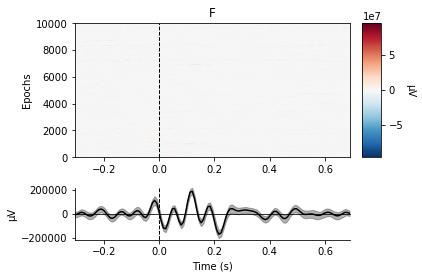

Not setting metadata
50128 matching events found
No baseline correction applied
0 projection items activated


<ipython-input-85-12dca37c2770>:4: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  de_epochs['0'].plot_image(picks=['F'])


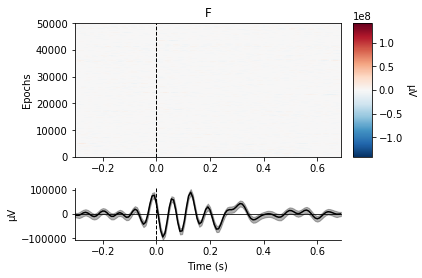

Not setting metadata
10026 matching events found
No baseline correction applied
0 projection items activated


<ipython-input-85-12dca37c2770>:5: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  de_epochs['1'].plot_image(picks=['C'])#P300


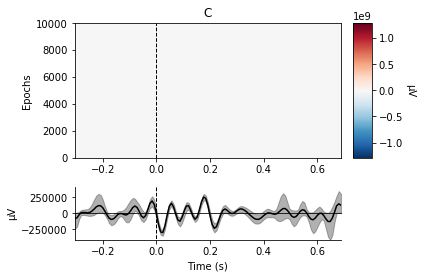

Not setting metadata
50128 matching events found
No baseline correction applied
0 projection items activated


<ipython-input-85-12dca37c2770>:6: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  de_epochs['0'].plot_image(picks=['C'])


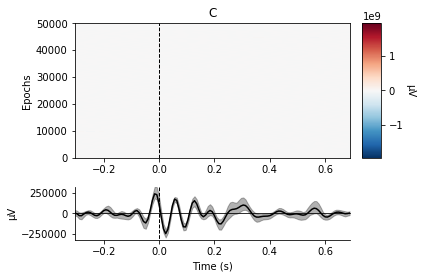

Not setting metadata
10026 matching events found
No baseline correction applied
0 projection items activated


<ipython-input-85-12dca37c2770>:7: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  de_epochs['1'].plot_image(picks=['P'])#P300


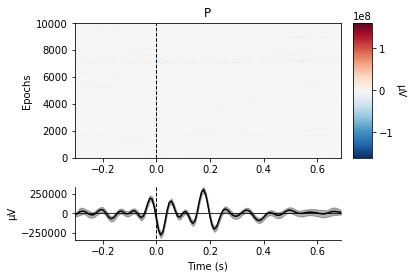

Not setting metadata
50128 matching events found
No baseline correction applied
0 projection items activated


<ipython-input-85-12dca37c2770>:8: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  de_epochs['0'].plot_image(picks=['P'])


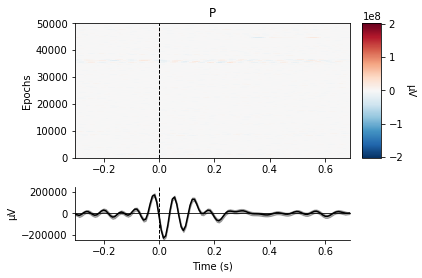

Not setting metadata
10026 matching events found
No baseline correction applied
0 projection items activated


<ipython-input-85-12dca37c2770>:9: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  de_epochs['1'].plot_image(picks=['O'])#P300


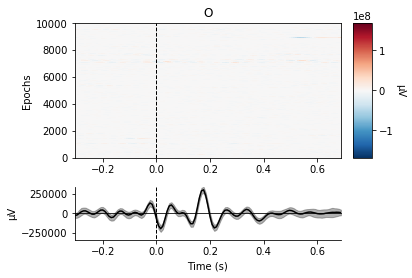

Not setting metadata
50128 matching events found
No baseline correction applied
0 projection items activated


<ipython-input-85-12dca37c2770>:10: RuntimeWarning: Cannot find channel coordinates in the supplied Evokeds. Not showing channel locations.
  de_epochs['0'].plot_image(picks=['O'])


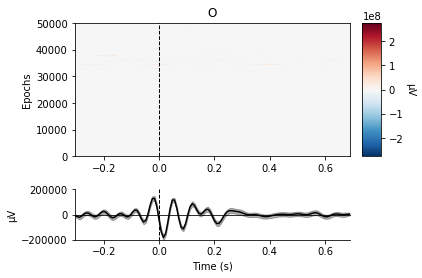

[<Figure size 432x288 with 3 Axes>]

In [85]:
de_epochs2 = epochs.copy().apply_function(derivada)
de_epochs = de_epochs2.copy().apply_function(derivada)
de_epochs['1'].plot_image(picks=['F'])#P300
de_epochs['0'].plot_image(picks=['F'])
de_epochs['1'].plot_image(picks=['C'])#P300
de_epochs['0'].plot_image(picks=['C'])
de_epochs['1'].plot_image(picks=['P'])#P300
de_epochs['0'].plot_image(picks=['P'])
de_epochs['1'].plot_image(picks=['O'])#P300
de_epochs['0'].plot_image(picks=['O'])

In [86]:
mean_target_part1, mean_target_part2 ,mean_target_part3 ,mean_target_part4 = ventanas_derivada_mean(target,-0.3,0,0.25,0.4,0.7)
mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4 = ventanas_derivada_mean(standard,-0.3,0,0.25,0.4,0.7)
mean_standard_part1.shape

<ipython-input-84-d2412f9e7ac2>:9: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = de_epochs.copy().crop(tmin=m4, tmax=F)
<ipython-input-84-d2412f9e7ac2>:9: RuntimeWarning: tmax is not in time interval. tmax is set to <class 'mne.epochs.EpochsFIF'>.tmax (0.688 sec)
  epochs_part4 = de_epochs.copy().crop(tmin=m4, tmax=F)


(50128, 4)

In [87]:
featuresT = np.concatenate((mean_target_part1, mean_target_part2, mean_target_part3, mean_target_part4), axis=1)
featuresF = np.concatenate((mean_standard_part1, mean_standard_part2, mean_standard_part3, mean_standard_part4), axis=1)
labelT = np.ones([len(mean_target_part1)])
labelF = np.zeros([len(mean_standard_part1)])
features = np.concatenate((featuresT,featuresF), axis=0)
labels = np.concatenate((labelT,labelF), axis=0)

print(features.shape)
print(labels.shape)

(60154, 16)
(60154,)


In [88]:
data_df = pd.DataFrame(features)
data_df['P300'] =labels

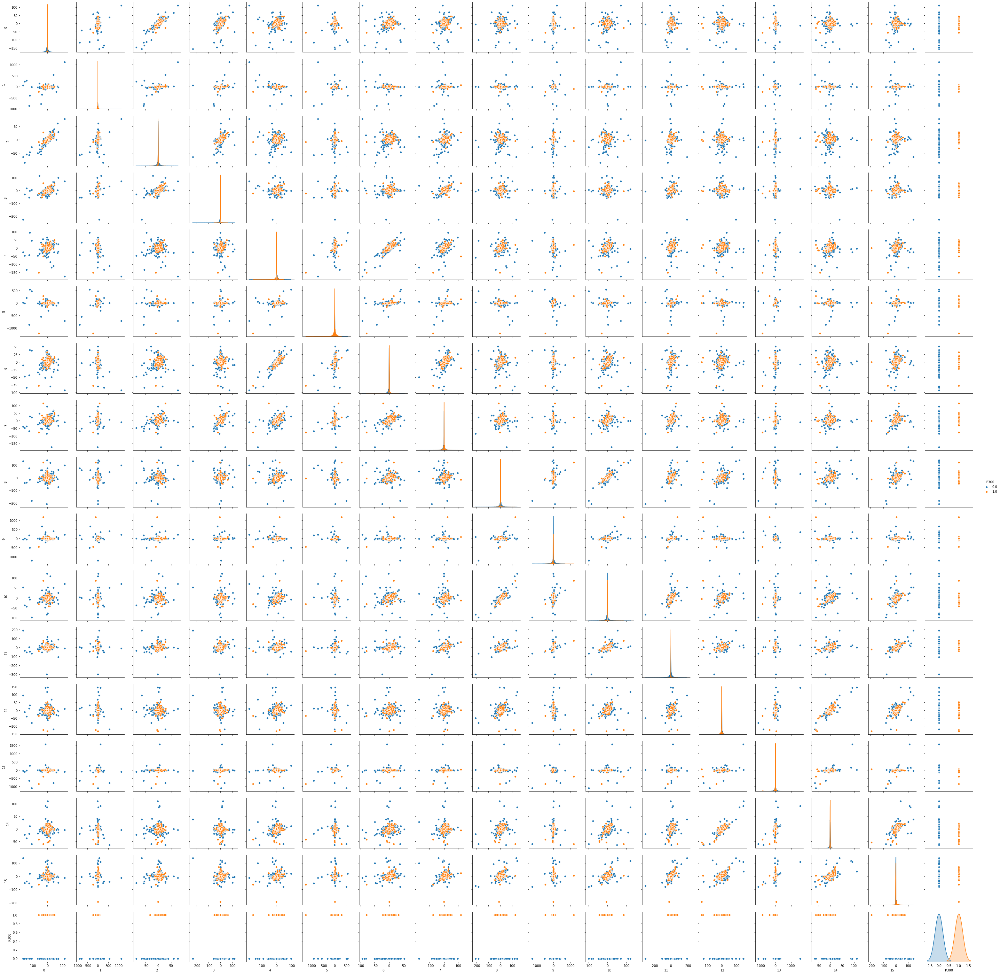

In [89]:
sns.pairplot(data_df, hue="P300", diag_kws={'bw': 0.2})